# Image Captioning: CNN Encoder + Transformer Decoder

## Teaching a Model to Describe What It Sees

In this notebook we combine two things you already know:
- **CNN feature extraction** (from our ResNet fine-tuning project)
- **Transformer decoding** (from our NMT and CharGPT notebooks)

The architecture is simple: a pretrained ResNet extracts visual features
from an image (the "encoder"), and a Transformer decoder generates a
text caption one word at a time, using **cross-attention** to look at
the relevant parts of the image at each step.

### The architecture

```
Image → ResNet (frozen) → spatial feature grid → [Transformer Decoder] → "a dog playing in the park"
                                                       ↑
                                              cross-attention!
                                         (same as NMT decoder → encoder)
```

### Connections to what we've built

| NMT Transformer | Image Captioning |
|---|---|
| Encoder: Transformer self-attention over source words | Encoder: ResNet CNN over image pixels |
| Encoder output: one vector per source token | Encoder output: one vector per spatial region |
| Decoder cross-attention: "which source words matter?" | Decoder cross-attention: "which image regions matter?" |
| Output: Spanish words | Output: English caption words |

The decoder is **identical** to the NMT decoder. It doesn't know or care
that the encoder features come from an image rather than a sentence.
Cross-attention just sees a sequence of key-value vectors.

In [1]:
!pip install datasets pillow -q

In [2]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning, module="transformers")
!pip install transformers -q

In [3]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models
import torchvision.transforms as transforms
import math
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from collections import Counter
import time
import os

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

Using device: cuda


---
## 1. Load the Flickr8k Dataset

Flickr8k contains 8,000 images, each with 5 human-written captions.
The captions describe what's happening in the image in plain English.

This is like our NMT dataset, but instead of (source sentence, target sentence)
pairs, we have (image, caption) pairs.

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [5]:
from datasets import load_dataset
import datasets

print("Loading Flickr8k dataset...")
ds = load_dataset("jxie/flickr8k", cache_dir = "content/drive/MyDrive/Colab/datasets")
print(ds)

# Explore the data
print(f"\nTrain examples: {len(ds['train'])}")
print(f"Test examples:  {len(ds['test'])}")

# Show a sample
sample = ds['train'][0]
print(f"\nSample keys: {list(sample.keys())}")
print(f"Sample caption: {sample['caption_0']}")

Loading Flickr8k dataset...


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:93: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


DatasetDict({
    train: Dataset({
        features: ['image', 'caption_0', 'caption_1', 'caption_2', 'caption_3', 'caption_4'],
        num_rows: 6000
    })
    validation: Dataset({
        features: ['image', 'caption_0', 'caption_1', 'caption_2', 'caption_3', 'caption_4'],
        num_rows: 1000
    })
    test: Dataset({
        features: ['image', 'caption_0', 'caption_1', 'caption_2', 'caption_3', 'caption_4'],
        num_rows: 1000
    })
})

Train examples: 6000
Test examples:  1000

Sample keys: ['image', 'caption_0', 'caption_1', 'caption_2', 'caption_3', 'caption_4']
Sample caption: A black dog is running after a white dog in the snow .


In [6]:
from tqdm.auto import tqdm

new_train = []
new_test = []

ds2 = datasets.DatasetDict()

for x in tqdm(ds['train'], desc="Processing train captions"):
  image = x['image']
  c0 = x['caption_0']
  c1 = x['caption_1']
  c2 = x['caption_2']
  c3 = x['caption_3']
  c4 = x['caption_4']

  y0 = {"image": image, "caption": c0}
  y1 = {"image": image, "caption": c1}
  y2 = {"image": image, "caption": c2}
  y3 = {"image": image, "caption": c3}
  y4 = {"image": image, "caption": c4}

  new_train.append(y0)
  new_train.append(y1)
  new_train.append(y2)
  new_train.append(y3)
  new_train.append(y4)

for x in tqdm(ds['test'], desc="Processing test captions"):
  image = x['image']
  c0 = x['caption_0']
  y0 = {"image": image, "caption": c0}

  new_test.append(y0)

ds['train'] = datasets.Dataset.from_list(new_train)
ds['test'] = datasets.Dataset.from_list(new_test)

print(ds)

Processing train captions:   0%|          | 0/6000 [00:00<?, ?it/s]

Processing test captions:   0%|          | 0/1000 [00:00<?, ?it/s]

DatasetDict({
    train: Dataset({
        features: ['image', 'caption'],
        num_rows: 30000
    })
    validation: Dataset({
        features: ['image', 'caption_0', 'caption_1', 'caption_2', 'caption_3', 'caption_4'],
        num_rows: 1000
    })
    test: Dataset({
        features: ['image', 'caption'],
        num_rows: 1000
    })
})


In [7]:

# Explore the data
print(f"\nTrain examples: {len(ds['train'])}")
print(f"Test examples:  {len(ds['test'])}")

# Show a sample
sample = ds['train'][0]
print(f"\nSample keys: {list(sample.keys())}")
print(f"Sample caption: {sample['caption']}")


Train examples: 30000
Test examples:  1000

Sample keys: ['image', 'caption']
Sample caption: A black dog is running after a white dog in the snow .


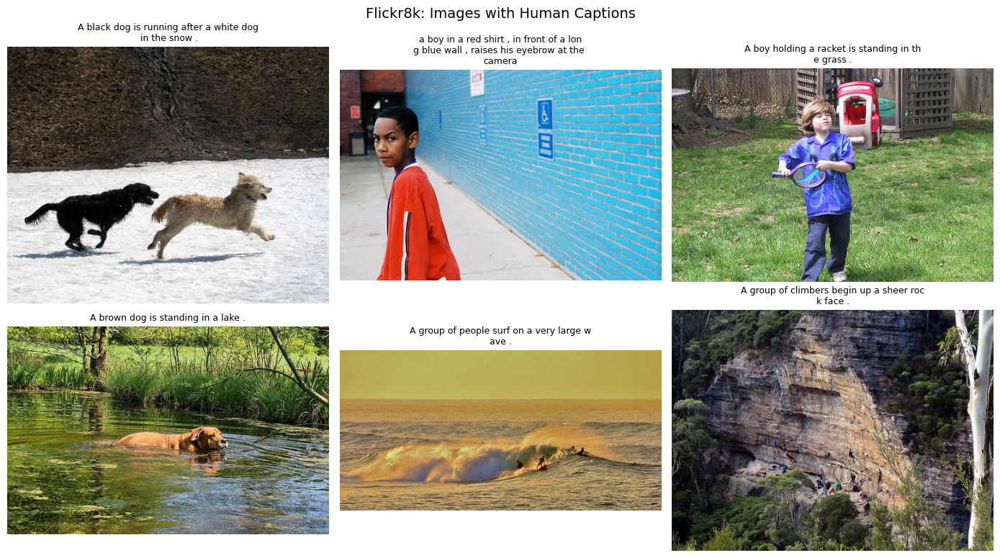

In [8]:
# Visualize some examples
fig, axes = plt.subplots(2, 3, figsize=(14, 8))
for i, ax in enumerate(axes.flatten()):
    sample = ds['train'][i * 100]
    ax.imshow(sample['image'])
    caption = sample['caption']
    # Wrap long captions
    wrapped = '\n'.join([caption[j:j+40] for j in range(0, len(caption), 40)])
    ax.set_title(wrapped, fontsize=9)
    ax.axis('off')
plt.suptitle('Flickr8k: Images with Human Captions', fontsize=14)
plt.tight_layout()
plt.show()

---
## 2. Build a Vocabulary

Use the GPT2 Tokenizer so unknown words can be processed

In [9]:
import re
from transformers import GPT2Tokenizer

class Vocabulary:
    """Word-level vocabulary using GPT2Tokenizer."""
    def __init__(self, min_freq=3, tokenizer_name='gpt2'):
        self.tokenizer = GPT2Tokenizer.from_pretrained(tokenizer_name)


        self.tokenizer.add_special_tokens({
            'pad_token': '<pad>',
            'bos_token': '<sos>',
            'unk_token': '<unk>',
        })

        self.PAD = self.tokenizer.pad_token_id   # 50257 or 50258
        self.SOS = self.tokenizer.bos_token_id   # distinct from EOS
        self.EOS = self.tokenizer.eos_token_id   # 50256
        self.UNK = self.tokenizer.unk_token_id
        self.SPECIAL = [self.PAD, self.SOS, self.EOS, self.UNK]

        # These are kept for compatibility but will primarily use tokenizer's internal vocab
        self.idx2word = list(self.tokenizer.get_vocab().keys())
        self.word2idx = self.tokenizer.get_vocab()
        self.min_freq = min_freq # min_freq might not be directly used by pre-trained tokenizer

    def build(self, captions):
        # For GPT2Tokenizer, vocab is already built from pretrained model.
        # We only need to ensure special tokens are correctly registered.
        # This method is kept for compatibility with the original flow.
        return self

    def clean_caption(self, caption):
        """Lowercase and remove punctuation except apostrophes. (GPT2 tokenizer handles most)"""
        caption = caption.lower().strip()
        # GPT2 tokenizer handles a lot of normalization, but some basic cleaning helps.
        caption = re.sub(r"[^a-z0-9\s']", '', caption)
        caption = re.sub(r'\s+', ' ', caption).strip()
        return caption

    def encode(self, caption, max_len=30):
        cleaned_caption = self.clean_caption(caption)
        # Tokenize, add SOS/EOS manually for consistency with original model logic
        tokens = [self.SOS] + self.tokenizer.encode(cleaned_caption, add_special_tokens=False)
        if len(tokens) >= max_len:
            tokens = tokens[:max_len - 1] + [self.EOS]
        else:
            tokens.append(self.EOS)
        return tokens

    def decode(self, ids):
        # Filter out special tokens for decoding, then use tokenizer's decode
        filtered_ids = [token_id for token_id in ids if token_id not in self.SPECIAL]
        return self.tokenizer.decode(filtered_ids, skip_special_tokens=True).strip()

    def __len__(self):
        return len(self.tokenizer)

# Build vocabulary from training captions
# The build method for GPT2Tokenizer just ensures special tokens are set up.
all_captions = [ex['caption'] for ex in ds['train']]
vocab = Vocabulary(min_freq=3).build(all_captions)

print(f"Vocabulary size: {len(vocab):,}")
print(f"Sample encode: '{all_captions[0]}'")
encoded = vocab.encode(all_captions[0])
print(f"  → {encoded}")
print(f"  → '{vocab.decode(encoded)}'")
print(f"PAD={vocab.PAD}, SOS={vocab.SOS}, EOS={vocab.EOS}, UNK={vocab.UNK}")

Vocabulary size: 50,260
Sample encode: 'A black dog is running after a white dog in the snow .'
  → [50258, 64, 2042, 3290, 318, 2491, 706, 257, 2330, 3290, 287, 262, 6729, 50256]
  → 'a black dog is running after a white dog in the snow'
PAD=50257, SOS=50258, EOS=50256, UNK=50259


---
## 3. Image Encoder: Pretrained ResNet

This is the same pretrained ResNet from your fine-tuning project, but
used differently. Instead of taking the final classification output
(a single vector), we take the **spatial feature map** from the last
convolutional layer — before the global average pooling.

For ResNet-50, this gives us a (7 × 7 × 2048) feature map.
We reshape it to (49, 2048) — 49 spatial positions, each with a
2048-dimensional feature vector. These 49 vectors play the same role
as the encoder hidden states h₁...hₙ in our NMT model, except each
one represents a region of the image rather than a word.

```
NMT:   [h₁, h₂, ..., h₂₀]     — one vector per source word
Image: [r₁, r₂, ..., r₄₉]     — one vector per 32×32 pixel region
```

The decoder's cross-attention doesn't know the difference — it just
attends to a sequence of key-value vectors.

In [10]:
class ImageEncoder(nn.Module):
    """
    Pretrained ResNet-50 as an image encoder.

    Outputs a sequence of spatial feature vectors that the Transformer
    decoder will attend to via cross-attention — just like the NMT
    encoder produced a sequence of hidden states for each source word.

    Output shape: (batch, 49, d_model)
                   49 = 7×7 spatial grid positions
    """
    def __init__(self, d_model):
        super().__init__()
        resnet = models.resnet50(weights=models.ResNet50_Weights.DEFAULT)

        # Remove the final avgpool and fc layers — we want the spatial features
        # This keeps: conv1 → bn1 → relu → maxpool → layer1-4
        self.backbone = nn.Sequential(*list(resnet.children())[:-2])

        # Freeze the CNN — just like we froze ResNet during fine-tuning
        for param in self.backbone.parameters():
            param.requires_grad = False

        # Project from ResNet's 2048 features to our Transformer's d_model
        self.projection = nn.Linear(2048, d_model)

    def forward(self, images):
        """
        images: (batch, 3, 224, 224)
        returns: (batch, 49, d_model) — 49 spatial region features
        """
        with torch.no_grad():
            features = self.backbone(images)   # (batch, 2048, 7, 7)

        # Reshape: (batch, 2048, 7, 7) → (batch, 2048, 49) → (batch, 49, 2048)
        batch_size = features.size(0)
        features = features.view(batch_size, 2048, -1).permute(0, 2, 1)

        # Project to d_model dimensions
        features = self.projection(features)   # (batch, 49, d_model)

        return features


# Verify
_test_enc = ImageEncoder(d_model=256)
_test_img = torch.randn(2, 3, 224, 224)
_test_out = _test_enc(_test_img)
print(f"Input:  {_test_img.shape}")      # (2, 3, 224, 224)
print(f"Output: {_test_out.shape}")      # (2, 49, 256)
print(f"\n49 = 7×7 spatial regions, each with a {256}-dim feature vector")
print(f"This is like having 49 'encoder hidden states' for the decoder.")
del _test_enc, _test_img, _test_out

Input:  torch.Size([2, 3, 224, 224])
Output: torch.Size([2, 49, 256])

49 = 7×7 spatial regions, each with a 256-dim feature vector
This is like having 49 'encoder hidden states' for the decoder.


---
## 4. Transformer Decoder (from NMT)

This is the **same decoder architecture** from our NMT notebook.
Three sublayers per block:
1. Masked self-attention (caption attends to itself)
2. Cross-attention (caption attends to image features)
3. Feed-forward

The only difference from NMT: the key/value vectors in cross-attention
come from a CNN instead of a Transformer encoder. But the decoder
doesn't know or care — it just sees (batch, seq_len, d_model) vectors.

In [11]:
# These are copied directly from our NMT notebook — no changes needed

def scaled_dot_product_attention(Q, K, V, mask=None):
    d_k = K.size(-1)
    scores = torch.matmul(Q, K.transpose(-2, -1)) / math.sqrt(d_k)
    if mask is not None:
        scores = scores.masked_fill(mask == 0, float('-inf'))
    attn_weights = F.softmax(scores, dim=-1)
    output = torch.matmul(attn_weights, V)
    return output, attn_weights


class MultiHeadAttention(nn.Module):
    def __init__(self, d_model, num_heads):
        super().__init__()
        assert d_model % num_heads == 0
        self.d_model = d_model
        self.num_heads = num_heads
        self.d_k = d_model // num_heads
        self.W_q = nn.Linear(d_model, d_model)
        self.W_k = nn.Linear(d_model, d_model)
        self.W_v = nn.Linear(d_model, d_model)
        self.W_o = nn.Linear(d_model, d_model)

    def forward(self, query, key, value, mask=None):
        batch_size = query.size(0)
        Q = self.W_q(query)
        K = self.W_k(key)
        V = self.W_v(value)
        Q = Q.view(batch_size, -1, self.num_heads, self.d_k).transpose(1, 2)
        K = K.view(batch_size, -1, self.num_heads, self.d_k).transpose(1, 2)


        V = V.view(batch_size, -1, self.num_heads, self.d_k).transpose(1, 2)
        attn_output, attn_weights = scaled_dot_product_attention(Q, K, V, mask)
        attn_output = attn_output.transpose(1, 2).contiguous()
        attn_output = attn_output.view(batch_size, -1, self.d_model)
        return self.W_o(attn_output), attn_weights


class FeedForward(nn.Module):
    def __init__(self, d_model, d_ff, dropout=0.1):
        super().__init__()
        self.linear1 = nn.Linear(d_model, d_ff)
        self.linear2 = nn.Linear(d_ff, d_model)
        self.dropout = nn.Dropout(dropout)

    def forward(self, x):
        return self.linear2(self.dropout(F.relu(self.linear1(x))))

In [12]:
class CaptionDecoderLayer(nn.Module):
    """
    Identical to the NMT DecoderLayer:
      1. Masked self-attention (caption tokens attend to previous tokens)
      2. Cross-attention (caption tokens attend to image regions)
      3. Feed-forward

    In NMT, cross-attention connected decoder → source sentence.
    Here, it connects decoder → image spatial features.
    Same mechanism. Different modalities.
    """
    def __init__(self, d_model, num_heads, d_ff, dropout=0.1):
        super().__init__()
        self.self_attn = MultiHeadAttention(d_model, num_heads)
        self.cross_attn = MultiHeadAttention(d_model, num_heads)
        self.feed_forward = FeedForward(d_model, d_ff, dropout)
        self.norm1 = nn.LayerNorm(d_model)
        self.norm2 = nn.LayerNorm(d_model)
        self.norm3 = nn.LayerNorm(d_model)
        self.dropout1 = nn.Dropout(dropout)
        self.dropout2 = nn.Dropout(dropout)
        self.dropout3 = nn.Dropout(dropout)

    def forward(self, x, encoder_output, tgt_mask):
        # 1. Masked self-attention over caption tokens
        attn_out, _ = self.self_attn(x, x, x, tgt_mask)
        x = self.norm1(x + self.dropout1(attn_out))

        # 2. Cross-attention: caption queries → image features
        #    Q = caption,  K = V = image features
        #    "Which image regions should I look at to generate the next word?"
        attn_out, _ = self.cross_attn(x, encoder_output, encoder_output)
        x = self.norm2(x + self.dropout2(attn_out))

        # 3. Feed-forward
        ff_out = self.feed_forward(x)
        x = self.norm3(x + self.dropout3(ff_out))

        return x

---
## 5. Full Captioning Model

Putting it together:

```
Image → ResNet encoder → spatial features (49, d_model)
                                ↓ (cross-attention K, V)
Caption → word embedding + positional encoding → decoder layers → linear → vocabulary logits
```

Compare to our NMT Transformer:
```
Source → embedding + pos_enc → encoder layers → encoder output
                                     ↓ (cross-attention K, V)
Target → embedding + pos_enc → decoder layers → linear → vocabulary logits
```

The only structural change: we replaced the Transformer encoder with a CNN.

In [13]:
class ImageCaptioner(nn.Module):
    def __init__(self, vocab_size, d_model=256, num_heads=8, num_layers=3,
                 d_ff=512, max_caption_len=30, dropout=0.1):
        super().__init__()
        self.d_model = d_model
        self.max_caption_len = max_caption_len

        self.encoder = ImageEncoder(d_model)

        self.word_embedding = nn.Embedding(vocab_size, d_model, padding_idx=vocab.PAD)
        self.pos_embedding = nn.Embedding(max_caption_len, d_model)
        self.dropout = nn.Dropout(dropout)

        self.decoder_layers = nn.ModuleList(
            [CaptionDecoderLayer(d_model, num_heads, d_ff, dropout)
             for _ in range(num_layers)]
        )

        self.norm = nn.LayerNorm(d_model)
        self.output_projection = nn.Linear(d_model, vocab_size)

        mask = torch.tril(torch.ones(max_caption_len, max_caption_len))
        self.register_buffer('causal_mask', mask.view(1, 1, max_caption_len, max_caption_len))

    def encode_image(self, images):
        return self.encoder(images)

    def decode(self, captions, encoder_output):
        B, T = captions.shape
        tok = self.word_embedding(captions) * math.sqrt(self.d_model)
        pos = self.pos_embedding(torch.arange(T, device=captions.device))
        x = self.dropout(tok + pos)
        tgt_mask = self.causal_mask[:, :, :T, :T]
        for layer in self.decoder_layers:
            x = layer(x, encoder_output, tgt_mask)
        x = self.norm(x)
        logits = self.output_projection(x)
        return logits

    def forward(self, images, captions):
        encoder_output = self.encode_image(images)
        logits = self.decode(captions, encoder_output)
        return logits

    @torch.no_grad()
    def generate(self, images, max_len=30, sos_idx=50256, eos_idx=50256,
                 temperature=1.0, top_k=None, min_p=None):
        """
        Autoregressive generation using current vocab IDs, with optional sampling strategies.
        Args:
            images: Batch of image tensors (batch_size, 3, H, W)
            max_len: Maximum length of the generated caption.
            sos_idx: Start-of-sequence token ID.
            eos_idx: End-of-sequence token ID.
            temperature: Softmax temperature. Higher values make the distribution flatter. (Default: 1.0)
            top_k: If not None, keep only the top_k most likely tokens for sampling. (Default: None)
            min_p: If not None, keep only tokens whose cumulative probability is less than or equal to min_p. (Default: None)
        Returns:
            Generated caption token IDs (batch_size, generated_length).
        """
        self.eval()
        encoder_output = self.encode_image(images) # (batch_size, 49, d_model)
        batch_size = images.size(0)
        generated = torch.full((batch_size, 1), sos_idx, dtype=torch.long, device=images.device) # (batch_size, 1)

        for _ in range(max_len - 1):
            # Decode up to the current generated length
            logits = self.decode(generated, encoder_output) # (batch_size, current_seq_len, vocab_size)
            next_token_logits = logits[:, -1, :]           # (batch_size, vocab_size) - logits for the next token

            # Apply temperature scaling
            if temperature != 1.0:
                next_token_logits = next_token_logits / temperature

            # --- Sampling Logic per batch item ---
            next_tokens_batch = []
            for i in range(batch_size):
                logits_row = next_token_logits[i] # Logits for current batch item (vocab_size,)

                # Top-K filtering
                if top_k is not None and top_k > 0:
                    # Get the top_k values and their indices
                    values, _ = torch.topk(logits_row, top_k)
                    # Set logits of tokens outside the top_k to a very small number (-inf)
                    logits_row[logits_row < values[-1]] = float('-inf')

                # Min-P (Top-P) filtering
                if min_p is not None and min_p > 0.0 and min_p < 1.0:
                    sorted_logits, sorted_indices = torch.sort(logits_row, descending=True)
                    # Convert logits to probabilities (only for sorting and cumulative sum)
                    sorted_probs = F.softmax(sorted_logits, dim=-1)
                    cumulative_probs = torch.cumsum(sorted_probs, dim=-1)

                    # Find the index where cumulative probability first exceeds min_p
                    # All tokens from this index onward will be removed
                    indices_to_remove = cumulative_probs > min_p
                    # Shift the indices_to_remove to the right to keep the first token that made it exceed min_p
                    if indices_to_remove.any():
                        first_index_to_remove = torch.nonzero(indices_to_remove, as_tuple=True)[0][0]
                        logits_row[sorted_indices[first_index_to_remove:]] = float('-inf')


                # After filtering, sample from the modified distribution
                probs = F.softmax(logits_row, dim=-1) # Re-normalize probabilities after filtering

                # Ensure numerical stability if all probs became 0 (e.g., aggressive filtering)
                if probs.sum() == 0:
                    # Fallback: if all options filtered out, predict EOS
                    next_token_single = torch.tensor([eos_idx], device=images.device)
                else:
                    next_token_single = torch.multinomial(probs, num_samples=1)

                next_tokens_batch.append(next_token_single)

            next_token = torch.stack(next_tokens_batch).view(batch_size, 1) # (batch_size, 1)

            generated = torch.cat([generated, next_token], dim=1)

            # Early stopping check (original logic for batch_size=1)
            if (next_token == eos_idx).any() and batch_size == 1:
                break

        return generated

In [14]:
# Hyperparameters
D_MODEL = 256
NUM_HEADS = 8
NUM_LAYERS = 3
D_FF = 512
MAX_CAPTION_LEN = 30
DROPOUT = 0.25

model = ImageCaptioner(
    vocab_size=len(vocab),
    d_model=D_MODEL,
    num_heads=NUM_HEADS,
    num_layers=NUM_LAYERS,
    d_ff=D_FF,
    max_caption_len=MAX_CAPTION_LEN,
    dropout=DROPOUT
).to(device)

total = sum(p.numel() for p in model.parameters())
trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
frozen = total - trainable

print(f"Total parameters:     {total:,}")
print(f"Trainable parameters: {trainable:,} (decoder + projection)")
print(f"Frozen parameters:    {frozen:,} (ResNet backbone)")
print(f"\nThe ResNet is frozen — we only train the decoder.")
print(f"Same strategy as fine-tuning: reuse pretrained features.")

Total parameters:     52,196,500
Trainable parameters: 28,688,468 (decoder + projection)
Frozen parameters:    23,508,032 (ResNet backbone)

The ResNet is frozen — we only train the decoder.
Same strategy as fine-tuning: reuse pretrained features.


### Suggested Improved Hyperparameters
Increasing the depth and width of the Transformer decoder typically yields the best quality gains. Note that this will increase training time and memory usage.

In [15]:
# Improved Hyperparameters for better quality
D_MODEL = 512
NUM_HEADS = 8
NUM_LAYERS = 6  # Deeper decoder for better reasoning
D_FF = 2048     # 4x d_model is standard
MAX_CAPTION_LEN = 30
DROPOUT = 0.25

model = ImageCaptioner(
    vocab_size=len(vocab),
    d_model=D_MODEL,
    num_heads=NUM_HEADS,
    num_layers=NUM_LAYERS,
    d_ff=D_FF,
    max_caption_len=MAX_CAPTION_LEN,
    dropout=DROPOUT
).to(device)

print(f"New Trainable Parameters: {sum(p.numel() for p in model.parameters() if p.requires_grad):,}")

New Trainable Parameters: 77,806,164


---
## 6. Data Pipeline

We need to:
1. Preprocess images for ResNet (resize, normalize)
2. Tokenize and pad captions
3. Batch them together

In [16]:
from torch.utils.data import Dataset, DataLoader

train_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.RandomCrop(224),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

test_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])


class CaptionDataset(Dataset):
    def __init__(self, hf_dataset, vocab, transform, max_len=30):
        self.data = hf_dataset
        self.vocab = vocab
        self.transform = transform
        self.max_len = max_len

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]

        # Process image
        image = item['image'].convert('RGB')
        image = self.transform(image)

        # Process caption
        caption = item['caption']
        tokens = self.vocab.encode(caption, self.max_len)
        tokens += [self.vocab.PAD] * (self.max_len - len(tokens))
        tokens = torch.tensor(tokens, dtype=torch.long)

        return image, tokens


BATCH_SIZE = 320

train_dataset = CaptionDataset(ds['train'], vocab, train_transform, MAX_CAPTION_LEN)
test_dataset = CaptionDataset(ds['test'], vocab, test_transform, MAX_CAPTION_LEN)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE,
                          shuffle=True, num_workers=2, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE,
                         shuffle=False, num_workers=2, pin_memory=True)

# Verify
img_batch, cap_batch = next(iter(train_loader))
print(f"Image batch: {img_batch.shape}")     # (32, 3, 224, 224)
print(f"Caption batch: {cap_batch.shape}")   # (32, 30)
print(f"\nSample caption tokens: {cap_batch[0].tolist()}")
print(f"Decoded: '{vocab.decode(cap_batch[0].tolist())}'")

Image batch: torch.Size([320, 3, 224, 224])
Caption batch: torch.Size([320, 30])

Sample caption tokens: [50258, 11545, 14005, 7586, 6844, 256, 1046, 1359, 319, 31285, 2323, 50256, 50257, 50257, 50257, 50257, 50257, 50257, 50257, 50257, 50257, 50257, 50257, 50257, 50257, 50257, 50257, 50257, 50257, 50257]
Decoded: 'two pale brown dogs tussling on paved ground'


---
## 7. Training

Same training pattern as NMT: teacher forcing with shifted targets.

In [17]:
LEARNING_RATE = 1e-4

# Only optimize trainable parameters (decoder + projection, not ResNet)
optimizer = torch.optim.Adam(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=LEARNING_RATE
)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='min', patience=3, factor=0.5
)

In [18]:
def train_epoch(model, loader, optimizer):
    model.train()
    total_loss = 0
    for images, captions in loader:
        images = images.to(device)
        captions = captions.to(device)

        # Teacher forcing: input is captions[:-1], target is captions[1:]
        cap_input = captions[:, :-1]
        cap_target = captions[:, 1:]

        logits = model(images, cap_input)

        loss = F.cross_entropy(
            logits.reshape(-1, logits.size(-1)),
            cap_target.reshape(-1),
            ignore_index=vocab.PAD,
            label_smoothing=0.1
        )

        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(
            filter(lambda p: p.requires_grad, model.parameters()), 1.0
        )
        optimizer.step()

        total_loss += loss.item()

    return total_loss / len(loader)


@torch.no_grad()
def evaluate(model, loader):
    model.eval()
    total_loss = 0
    for images, captions in loader:
        images = images.to(device)
        captions = captions.to(device)
        cap_input = captions[:, :-1]
        cap_target = captions[:, 1:]

        logits = model(images, cap_input)
        loss = F.cross_entropy(
            logits.reshape(-1, logits.size(-1)),
            cap_target.reshape(-1),
            ignore_index=vocab.PAD
        )
        total_loss += loss.item()

    return total_loss / len(loader)

In [19]:
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Define checkpoint directory
CHECKPOINT_DIR = '/content/drive/MyDrive/Colab/captions_2'
os.makedirs(CHECKPOINT_DIR, exist_ok=True)
print(f"Checkpoint directory created at: {CHECKPOINT_DIR}")

# Define path for saving the best model
BEST_MODEL_PATH = os.path.join(CHECKPOINT_DIR, 'best_image_captioning_model.pth')


train_losses = []
test_losses = []
NUM_EPOCHS = 15
START_EPOCH = 1
PATIENCE = 5
patience_count = 0

best_test_loss = float('inf')

print(f"Training for {NUM_EPOCHS} epochs...")
print(f"  {len(train_loader)} batches/epoch, batch_size={BATCH_SIZE}")
print()

start_time = time.time()

for epoch in range(START_EPOCH, NUM_EPOCHS + START_EPOCH):
    train_loss = train_epoch(model, train_loader, optimizer)
    test_loss = evaluate(model, test_loader)

    train_losses.append(train_loss)
    test_losses.append(test_loss)

    scheduler.step(test_loss)

    elapsed = time.time() - start_time
    lr = optimizer.param_groups[0]['lr']
    print(f"Epoch {epoch:2d}/{NUM_EPOCHS} | "
          f"Train: {train_loss:.4f} | Test: {test_loss:.4f} | "
          f"LR: {lr:.2e} | {elapsed:.0f}s")

    # Save the model if it has the best test loss so far
    if test_loss < best_test_loss:
        patience_count = 0
        best_test_loss = test_loss
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': best_test_loss,
        }, BEST_MODEL_PATH)
        print(f"  --> New best model saved with test loss: {best_test_loss:.4f}")
    else:
      patience_count += 1
      if patience_count >= PATIENCE:
        print(f"  --> Early stopping triggered. Best test loss: {best_test_loss:.4f}")
        break

print(f"\nDone in {(time.time()-start_time)/60:.1f} minutes")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Checkpoint directory created at: /content/drive/MyDrive/Colab/captions_2
Training for 15 epochs...
  94 batches/epoch, batch_size=320

Epoch  1/15 | Train: 6.8630 | Test: 4.4698 | LR: 1.00e-04 | 115s
  --> New best model saved with test loss: 4.4698
Epoch  2/15 | Train: 5.1691 | Test: 3.8707 | LR: 1.00e-04 | 230s
  --> New best model saved with test loss: 3.8707
Epoch  3/15 | Train: 4.7932 | Test: 3.5700 | LR: 1.00e-04 | 345s
  --> New best model saved with test loss: 3.5700
Epoch  4/15 | Train: 4.5558 | Test: 3.3951 | LR: 1.00e-04 | 458s
  --> New best model saved with test loss: 3.3951
Epoch  5/15 | Train: 4.3874 | Test: 3.2685 | LR: 1.00e-04 | 570s
  --> New best model saved with test loss: 3.2685
Epoch  6/15 | Train: 4.2527 | Test: 3.1662 | LR: 1.00e-04 | 683s
  --> New best model saved with test loss: 3.1662
Epoch  7/15 | Train: 4.1409 | Test: 3.0817 | L

---

---
## 8. Generate Captions

Let's see what the model produces for test images.

In [25]:
# Load the best model for inference
import random
checkpoint = torch.load(BEST_MODEL_PATH, map_location=device)
model.load_state_dict(checkpoint['model_state_dict'])
print(f"Best model loaded from epoch {checkpoint['epoch']} with test loss: {checkpoint['loss']:.4f}")

Best model loaded from epoch 14 with test loss: 2.8319


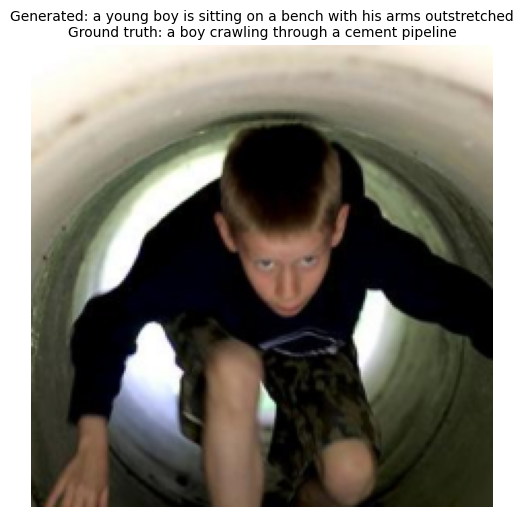

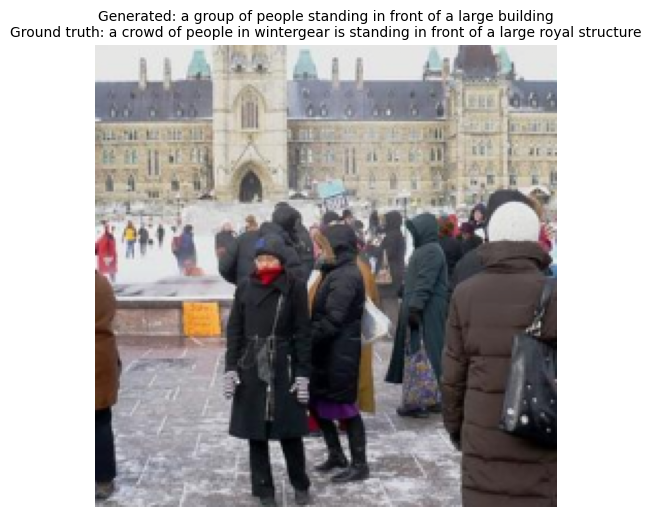

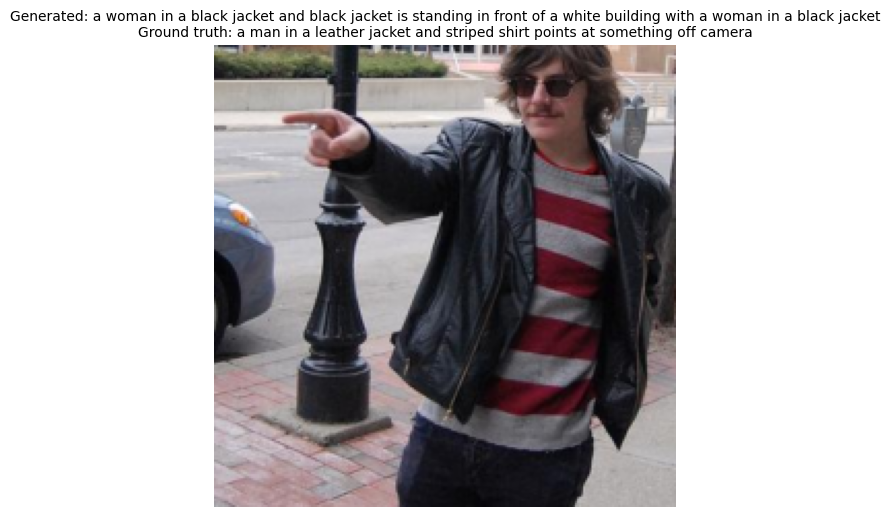

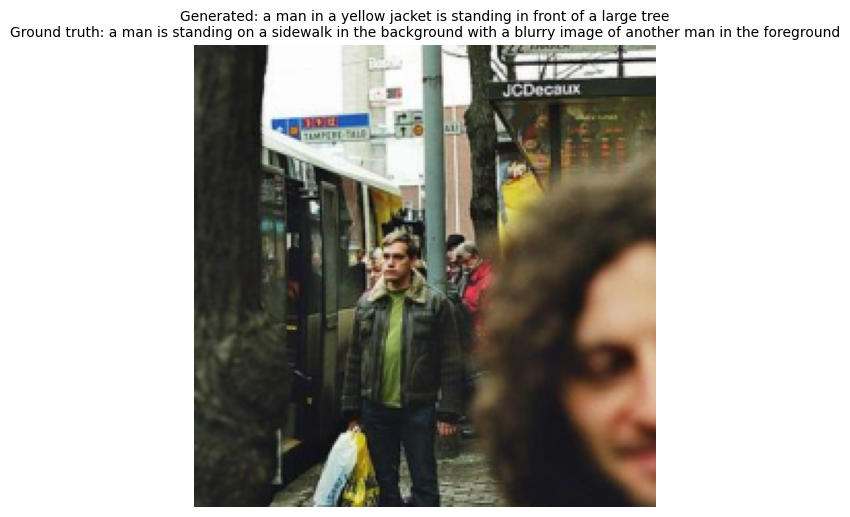

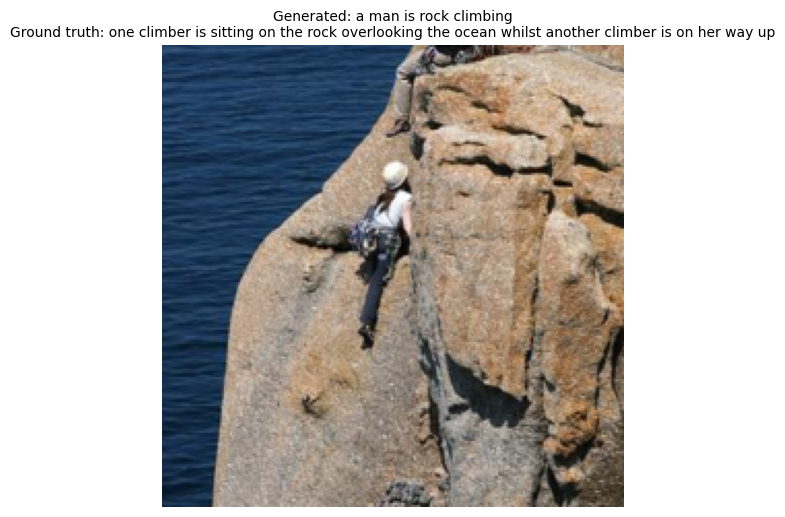

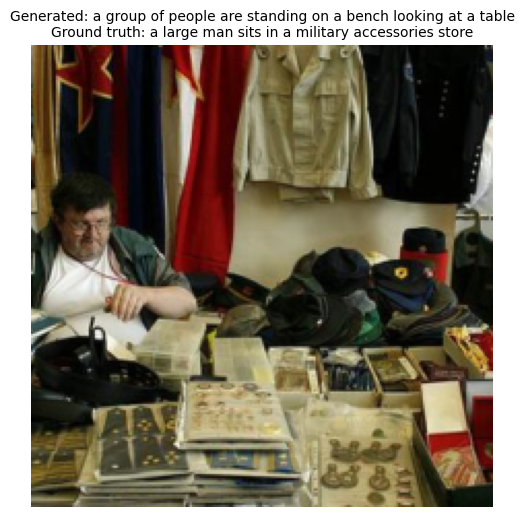

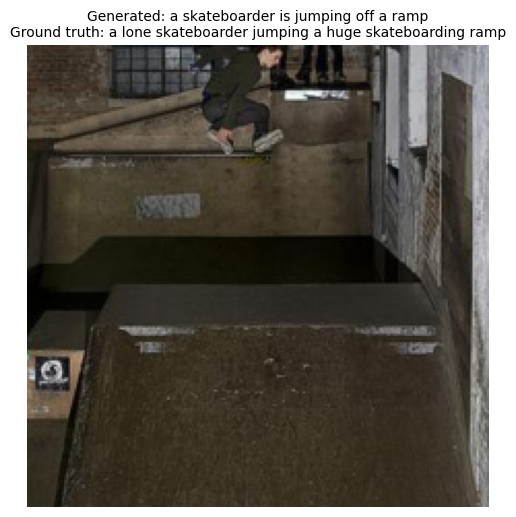

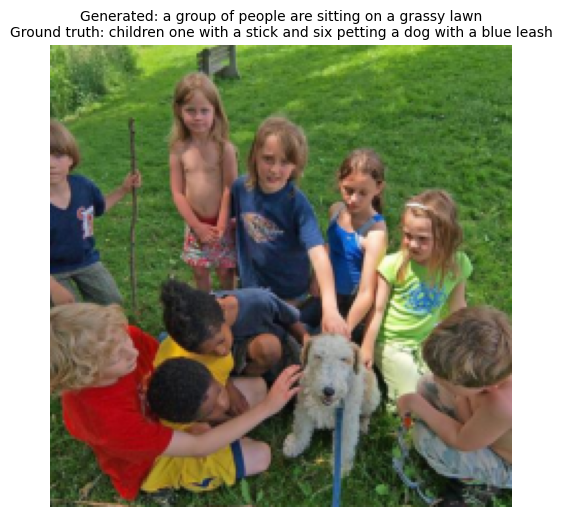

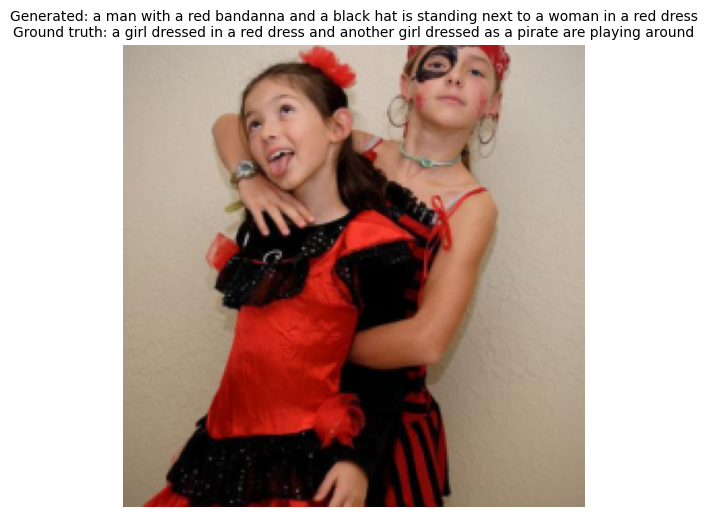

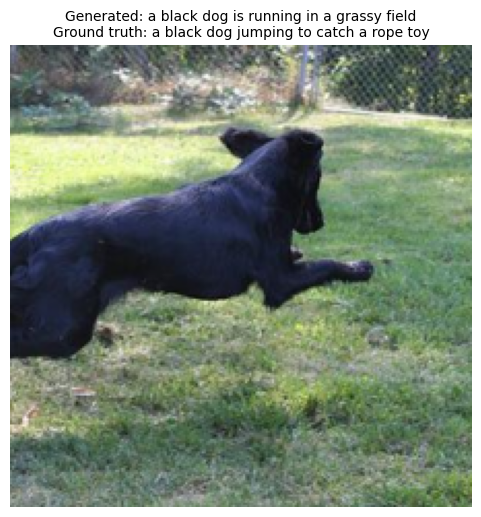

In [26]:
inv_normalize = transforms.Normalize(
    mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
    std=[1/0.229, 1/0.224, 1/0.225]
)

def show_caption(model, dataset, idx):
    model.eval()
    image_tensor, caption_tokens = dataset[idx]
    image_tensor = image_tensor.unsqueeze(0).to(device)

    # Use IDs from the vocab instance
    generated_ids = model.generate(image_tensor, max_len=MAX_CAPTION_LEN, sos_idx=vocab.SOS, eos_idx=vocab.EOS, temperature=0.3)
    generated_caption = vocab.decode(generated_ids[0].tolist())

    gt_caption = vocab.decode(caption_tokens.tolist())

    img_display = inv_normalize(image_tensor.squeeze(0).cpu())
    img_display = img_display.permute(1, 2, 0).clamp(0, 1).numpy()

    plt.figure(figsize=(6, 6))
    plt.imshow(img_display)
    plt.title(f"Generated: {generated_caption}\nGround truth: {gt_caption}", fontsize=10)
    plt.axis('off')
    plt.show()

for j in range(10):
    i = random.randint(0, len(test_dataset) - 1)
    show_caption(model, test_dataset, i)

---
## 9. Visualize Cross-Attention: Where Does the Model Look?

This is the payoff. The cross-attention weights tell us **which image
regions** the model focuses on when generating each word.

We extract the cross-attention weights from the last decoder layer,
average across heads, and reshape the 49 attention weights back to
the 7×7 spatial grid. Then we overlay this as a heatmap on the image.

This is exactly like the Bahdanau attention heatmaps from our NMT
notebook — but instead of showing which source *words* the decoder
attends to, it shows which image *regions* the decoder looks at.

In [22]:
def get_attention_maps(model, image_tensor):
    """
    Generate a caption and extract cross-attention weights at each step.
    Returns the generated caption and attention maps for each word.
    """
    model.eval()
    image_tensor = image_tensor.unsqueeze(0).to(device)

    # Encode image once
    encoder_output = model.encode_image(image_tensor)

    # Generate step by step, capturing attention at each step
    generated = [vocab.SOS]
    attention_maps = []

    for step in range(MAX_CAPTION_LEN - 1):
        tgt = torch.tensor([generated], dtype=torch.long, device=device)
        T = tgt.size(1)

        # Run through decoder manually to capture cross-attention
        tok = model.word_embedding(tgt) * math.sqrt(model.d_model)
        pos = model.pos_embedding(torch.arange(T, device=device))
        x = model.dropout(tok + pos)

        tgt_mask = model.causal_mask[:, :, :T, :T]

        cross_attn_weights = None
        for layer in model.decoder_layers:
            # Self-attention
            attn_out, _ = layer.self_attn(x, x, x, tgt_mask)
            x = layer.norm1(x + layer.dropout1(attn_out))

            # Cross-attention — capture these weights
            attn_out, cross_attn_weights = layer.cross_attn(
                x, encoder_output, encoder_output
            )
            x = layer.norm2(x + layer.dropout2(attn_out))

            # Feed-forward
            ff_out = layer.feed_forward(x)
            x = layer.norm3(x + layer.dropout3(ff_out))

        x = model.norm(x)
        logits = model.output_projection(x)
        next_token = logits[0, -1, :].argmax().item()

        # Save attention for this step (average across heads, last position)
        # cross_attn_weights: (1, num_heads, T, 49)
        attn = cross_attn_weights[0, :, -1, :].mean(dim=0)  # (49,)
        attention_maps.append(attn.cpu().detach().numpy())

        generated.append(next_token)
        if next_token == vocab.EOS:
            break

    return generated, attention_maps

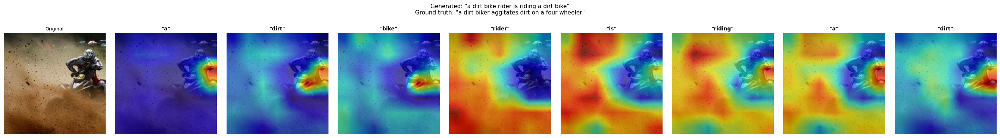

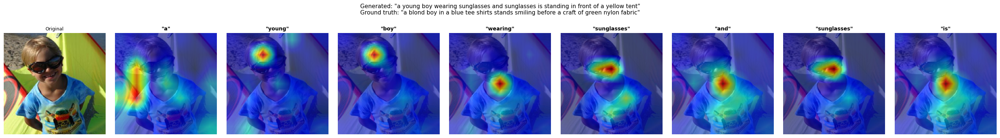

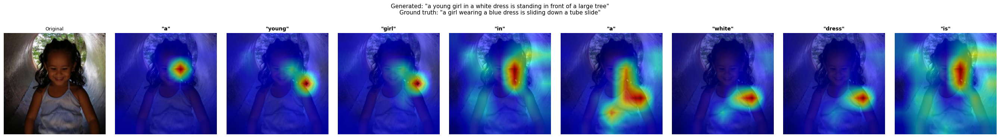

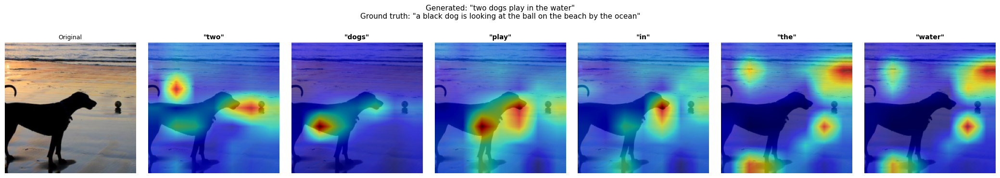

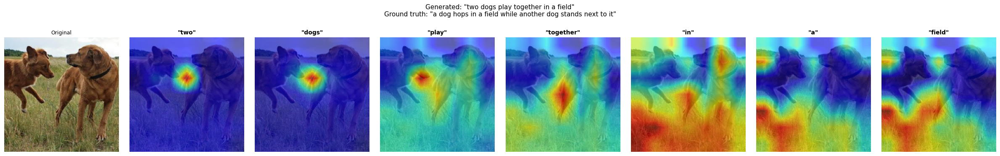

In [23]:
def visualize_attention(model, dataset, idx):
    """
    Show the image with attention heatmaps for each generated word.
    """
    image_tensor, gt_tokens = dataset[idx]

    # Get the raw image for display
    img_display = inv_normalize(image_tensor).permute(1, 2, 0).clamp(0, 1).numpy()

    # Generate caption with attention maps
    generated_ids, attention_maps = get_attention_maps(model, image_tensor)

    # Use the tokenizer to convert IDs to words correctly
    # skip <sos> at index 0
    words = []
    for idx_val in generated_ids[1:]:
        if idx_val == vocab.EOS:
            break
        # Use the tokenizer's method to get the string representation
        word = vocab.tokenizer.decode([idx_val]).strip()
        words.append(word)

    # Trim attention maps to match words
    attention_maps = attention_maps[:len(words)]

    if len(words) == 0:
        print("Model generated empty caption.")
        return

    # Plot: original image + attention for each word
    n_words = min(len(words), 8)  # show at most 8 words
    fig, axes = plt.subplots(1, n_words + 1, figsize=(3 * (n_words + 1), 3.5))

    # Original image
    axes[0].imshow(img_display)
    axes[0].set_title('Original', fontsize=9)
    axes[0].axis('off')

    # Attention heatmap for each word
    for i in range(n_words):
        ax = axes[i + 1]
        ax.imshow(img_display)

        # Reshape 49 attention weights to 7x7 and upscale to 224x224
        attn_map = attention_maps[i].reshape(7, 7)
        attn_map = np.array(Image.fromarray(attn_map).resize((224, 224), Image.BILINEAR))

        ax.imshow(attn_map, alpha=0.6, cmap='jet')
        ax.set_title(f'"{words[i]}"', fontsize=10, fontweight='bold')
        ax.axis('off')

    caption = ' '.join(words)
    gt = vocab.decode(gt_tokens.tolist())
    fig.suptitle(f'Generated: "{caption}"\nGround truth: "{gt}"',
                 fontsize=11, y=1.05)
    plt.tight_layout()
    plt.show()

# Visualize attention for several test images
for i in range(5):
    idx = random.randint(0, len(test_dataset) - 1)
    visualize_attention(model, test_dataset, idx)
    print()

---
## 10. Individual Attention Heads

Just like in our NMT notebook, different heads may specialize.
Some might focus on objects, others on backgrounds or spatial layout.

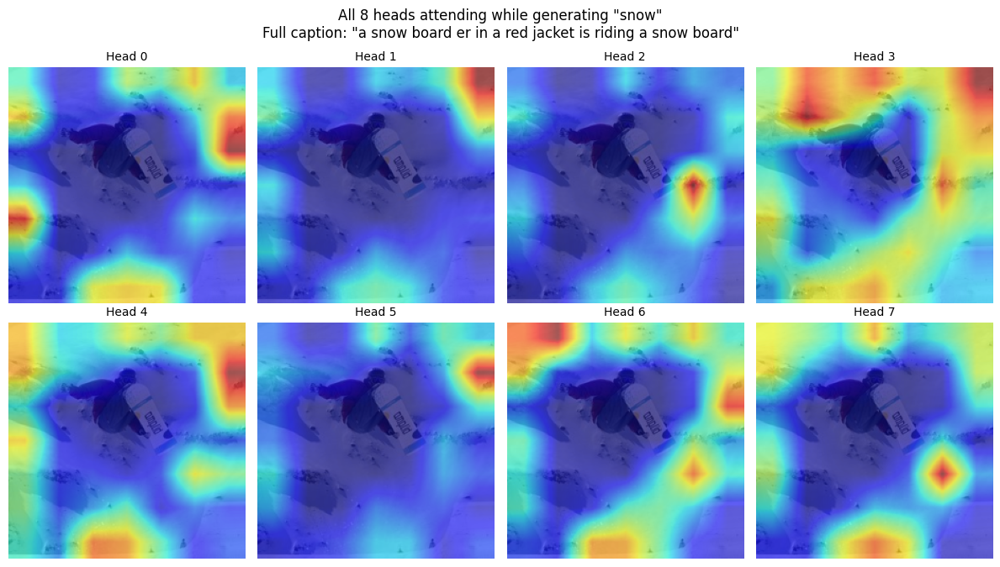

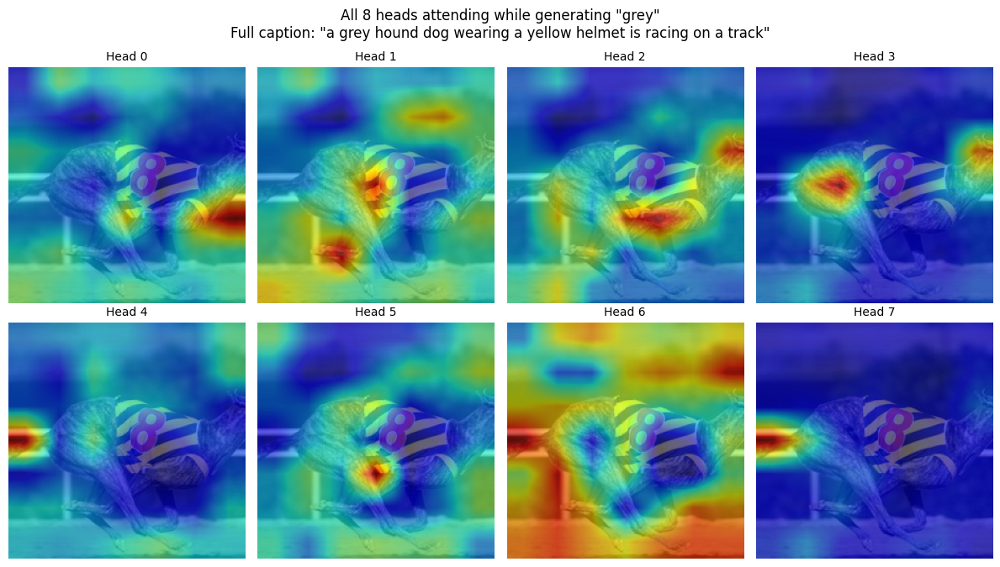

In [24]:
def visualize_heads(model, dataset, idx, word_idx=0):
    """
    Show all attention heads for a specific word in the generated caption.
    """
    image_tensor, gt_tokens = dataset[idx]
    img_display = inv_normalize(image_tensor).permute(1, 2, 0).clamp(0, 1).numpy()

    # Forward pass to get per-head attention
    model.eval()
    image_input = image_tensor.unsqueeze(0).to(device)
    encoder_output = model.encode_image(image_input)

    generated_ids, _ = get_attention_maps(model, image_tensor)
    words = []
    for id_val in generated_ids[1:]:
        if id_val == vocab.EOS:
            break
        # Use the tokenizer's method to get the string representation
        word = vocab.tokenizer.decode([id_val]).strip()
        words.append(word)

    # Re-run decoder to get per-head weights at the target step
    tgt = torch.tensor([generated_ids[:word_idx + 2]], dtype=torch.long, device=device)
    T = tgt.size(1)
    tok = model.word_embedding(tgt) * math.sqrt(model.d_model)
    pos = model.pos_embedding(torch.arange(T, device=device))
    x = model.dropout(tok + pos)
    tgt_mask = model.causal_mask[:, :, :T, :T]

    cross_w = None
    for layer in model.decoder_layers:
        attn_out, _ = layer.self_attn(x, x, x, tgt_mask)
        x = layer.norm1(x + layer.dropout1(attn_out))
        attn_out, cross_w = layer.cross_attn(x, encoder_output, encoder_output)
        x = layer.norm2(x + layer.dropout2(attn_out))
        ff_out = layer.feed_forward(x)
        x = layer.norm3(x + layer.dropout3(ff_out))

    # cross_w: (1, num_heads, T, 49)
    per_head = cross_w[0, :, -1, :].detach().cpu().numpy()  # (num_heads, 49)

    target_word = words[word_idx] if word_idx < len(words) else '?'

    fig, axes = plt.subplots(2, NUM_HEADS // 2, figsize=(3 * NUM_HEADS // 2, 7))
    for h, ax in enumerate(axes.flatten()):
        ax.imshow(img_display)
        attn_map = per_head[h].reshape(7, 7)
        attn_map = np.array(Image.fromarray(attn_map).resize((224, 224), Image.BILINEAR))
        ax.imshow(attn_map, alpha=0.6, cmap='jet')
        ax.set_title(f'Head {h}', fontsize=10)
        ax.axis('off')

    fig.suptitle(f'All {NUM_HEADS} heads attending while generating "{target_word}"\n'\
                 f'Full caption: "{" ".join(words)}"', fontsize=12)
    plt.tight_layout()
    plt.show()

# Visualize heads for a few examples
for i in range(2):
    idx = random.randint(0, len(test_dataset) - 1)
    visualize_heads(model, test_dataset, idx, word_idx=1)

---
## 11. Discussion

### What we built

A multimodal model — one that processes *both* images and text. The image
encoder (ResNet) and text decoder (Transformer) are completely different
architectures, connected by cross-attention. The cross-attention mechanism
is the universal bridge: it doesn't care what produced the key-value
vectors, only that they're in the right shape.

### Connections across the semester

| Concept | Where we first saw it | How it appears here |
|---|---|---|
| CNN feature extraction | ResNet fine-tuning project | Image encoder (frozen ResNet) |
| Cross-attention | Bahdanau attention in NMT | Decoder attending to image regions |
| Causal masking | NMT Transformer decoder | Caption generation (same mask) |
| Teacher forcing | Seq2seq RNN training | Training with ground truth captions |
| Transfer learning | ResNet fine-tuning | Frozen CNN + trained decoder |
| Attention visualization | NMT heatmaps | Heatmaps over image regions |

### The path to modern vision-language models

Our architecture (CNN + Transformer decoder) is the foundation of models like:

- **Show, Attend and Tell** (Xu et al., 2015) — same idea with LSTM decoder
- **BLIP / BLIP-2** (Salesforce) — more sophisticated bridge between vision and language
- **GPT-4V / Claude's vision** — same cross-attention principle at massive scale,
  with Vision Transformers (ViT) replacing CNNs as the image encoder

The core mechanism is always the same: encode the image into a sequence of
feature vectors, and let a language model attend to them via cross-attention.

### Questions to consider

1. The attention heatmaps show where the model "looks" when generating each word.
   Does it look at sensible regions? When generating "dog", does it attend to the dog?

2. Our image encoder produces 49 spatial regions (7×7). What would happen with
   more regions (14×14 = 196)? What's the tradeoff?

3. We froze the ResNet and only trained the decoder. What would happen if we
   unfroze the last few ResNet layers? (Think about our fine-tuning experiments.)

4. The same Transformer decoder that translated Spanish is now captioning images.
   What does this tell you about the generality of attention as a mechanism?

5. Modern models like GPT-4V use a Vision Transformer (ViT) instead of ResNet
   as the image encoder. ViT processes images using self-attention — so the
   entire model (encoder and decoder) would be pure Transformer. Why might
   that be advantageous?